# Self-Attention，Cross-Attentionが3層ずつ

In [1]:
import os
import json
import numpy as np
import shutil
import matplotlib.pyplot as plt
from PIL import Image
from tqdm import tqdm
from tokenizers import Tokenizer
from transformers import ViTFeatureExtractor, ViTModel, PreTrainedModel, PretrainedConfig

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch import optim
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms

2025-04-28 22:05:19.829475: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2025-04-28 22:05:19.877598: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2025-04-28 22:05:19.892016: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-04-28 22:05:19.982470: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2025-04-28 22:05:20.879157: W tensorflow/compiler/tf2

In [2]:
NO_WORD_IMAGE_ONLY = True
REAL_IMAGE_ONLY = True
REAL_IMAGE_THRESHOLD = 0.75
NO_UNIQUE_NOUN_SENTENCE_ONLY = True

MAX_SENTENCE_LENGTH = 31
MIN_SENTENCE_LENGTH = 4
MIN_FREQUENCY = 16

LERNING_RATE = 0.0001
BATCH_SIZE = 32
EPOCHS = 25
HIDDEN_DIM = 1024 # 512

result_dir = f"../results/GUMI_T3/{NO_WORD_IMAGE_ONLY}_{REAL_IMAGE_ONLY}_{REAL_IMAGE_THRESHOLD}_{NO_UNIQUE_NOUN_SENTENCE_ONLY}_{MAX_SENTENCE_LENGTH}_{MIN_SENTENCE_LENGTH}_{MIN_FREQUENCY}_{LERNING_RATE}_{BATCH_SIZE}_{EPOCHS}_{HIDDEN_DIM}/"
if os.path.exists(result_dir):
    shutil.rmtree(result_dir)
os.makedirs(result_dir, exist_ok= True)
with open(f"{result_dir}training_config.json", "w") as f:
    json.dump({
        "NO_WORD_IMAGE_ONLY": NO_WORD_IMAGE_ONLY,
        "REAL_IMAGE_ONLY": REAL_IMAGE_ONLY,
        "REAL_IMAGE_THRESHOLD": REAL_IMAGE_THRESHOLD,
        "NO_UNIQUE_NOUN_SENTENCE_ONLY": NO_UNIQUE_NOUN_SENTENCE_ONLY,

        "MAX_SENTENCE_LENGTH": MAX_SENTENCE_LENGTH,
        "MIN_SENTENCE_LENGTH": MIN_SENTENCE_LENGTH,
        "MIN_FREQUENCY": MIN_FREQUENCY,

        "LERNING_RATE": LERNING_RATE,
        "BATCH_SIZE": BATCH_SIZE,
        "EPOCHS": EPOCHS,
        "HIDDEN_DIM": HIDDEN_DIM
    }, f)

IMAGE_FEATURE_DIR = "../datas/image_features/ViT/"
os.makedirs(IMAGE_FEATURE_DIR, exist_ok = True)

In [3]:
IMAGE_DIR = "../datas/Bokete_Dataset/boke_image/"
data_dir = f"../datas/{NO_WORD_IMAGE_ONLY}_{REAL_IMAGE_ONLY}_{REAL_IMAGE_THRESHOLD}_{NO_UNIQUE_NOUN_SENTENCE_ONLY}_{MAX_SENTENCE_LENGTH}_{MIN_SENTENCE_LENGTH}_{MIN_FREQUENCY}/"

train_inputs_1 = np.load(f"{data_dir}train_inputs_1.npy")
train_inputs_2 = np.load(f"{data_dir}train_inputs_2.npy")
train_teacher_signals = np.load(f"{data_dir}train_teacher_signals.npy")
test_inputs_1 = np.load(f"{data_dir}test_inputs_1.npy")
test_inputs_2 = np.load(f"{data_dir}test_inputs_2.npy")
test_teacher_signals = np.load(f"{data_dir}test_teacher_signals.npy")
tokenizer = Tokenizer.from_file(f"{data_dir}tokenizer.json")
VOCAB_SIZE = tokenizer.get_vocab_size()

#
train_inputs_1.shape, train_inputs_2.shape, train_teacher_signals.shape, test_inputs_1.shape, test_inputs_2.shape, test_teacher_signals.shape, VOCAB_SIZE

((1363946,),
 (1363946, 32),
 (1363946, 32),
 (14118,),
 (14118, 32),
 (14118, 32),
 17363)

In [4]:
image_numbers = set(train_inputs_1.tolist() + test_inputs_1.tolist())
tmp_image_numbers = list()
for IN in image_numbers:
    if os.path.exists(f"{IMAGE_FEATURE_DIR}{IN}.npy"):
        continue
    tmp_image_numbers.append(IN)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model_name = "google/vit-base-patch16-224-in21k"
image_feature_extractor = ViTFeatureExtractor.from_pretrained(model_name) 
vit = ViTModel.from_pretrained(model_name)
vit = vit.to(device)
vit.eval()

bs = 512
for idx in tqdm(range(0, len(tmp_image_numbers), bs)):
    images = [Image.open(f"{IMAGE_DIR}{IN}.jpg").convert("RGB") for IN in tmp_image_numbers[idx:idx + bs]]
    images = image_feature_extractor(images, return_tensors="pt").to(device)
    
    with torch.no_grad():
        outputs = vit(**images)
    image_features = outputs.last_hidden_state[:, 1:, :].cpu().numpy()

    for i, IN in enumerate(tmp_image_numbers[idx:idx + bs]):
        np.save(f"{IMAGE_FEATURE_DIR}{IN}.npy", image_features[i])

preprocessor_config.json:   0%|          | 0.00/160 [00:00<?, ?B/s]

/home/user/Colab_20250113/lib/python3.11/site-packages/transformers/models/vit/feature_extraction_vit.py:28: FutureWarning: The class ViTFeatureExtractor is deprecated and will be removed in version 5 of Transformers. Please use ViTImageProcessor instead.
  warnings.warn(


config.json:   0%|          | 0.00/502 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/346M [00:00<?, ?B/s]

100%|██████████| 430/430 [21:12<00:00,  2.96s/it]


In [5]:
def make_image_dataloader(inputs_1, inputs_2, test_teacher_signals):
    class LoadImageDataset(Dataset):
        def __init__(self, inputs_1, inputs_2, test_teacher_signals):
            """
                inputs_1: 画像の番号からなるリスト
                inputs_2: 入力文からなるリスト
                test_teacher_signals: 教師信号からなるリスト
            """
            if len(inputs_1) != len(inputs_2):
                raise ValueError("inputs_1 and inputs_2 must have the same length.")
            if len(inputs_1) != len(test_teacher_signals):
                raise ValueError("inputs_1 and test_teacher_signals must have the same length.")

            self.inputs_1 = inputs_1
            self.inputs_2 = inputs_2
            self.test_teacher_signals = test_teacher_signals

        def __len__(self):
            return len(self.inputs_1)

        def __getitem__(self, idx):
            image_feature = torch.Tensor( np.load(f"{IMAGE_FEATURE_DIR}{self.inputs_1[idx]}.npy") ).to(torch.float32)
            input_sentence = torch.Tensor( self.inputs_2[idx] ).to(torch.int64)
            teacher_signal = torch.Tensor( self.test_teacher_signals[idx] ).to(torch.int64)
            
            return image_feature, input_sentence, teacher_signal

    dataset = LoadImageDataset(inputs_1, inputs_2, test_teacher_signals)
    dataloader = DataLoader(
        dataset, 
        batch_size = BATCH_SIZE, 
        num_workers = int(os.cpu_count() * 0.6), 
        shuffle = True
    )

    return dataloader

train_dataloader = make_image_dataloader(train_inputs_1, train_inputs_2, train_teacher_signals)
test_dataloader = make_image_dataloader(test_inputs_1, test_inputs_2, test_teacher_signals)

#
i1, i2, t = next(iter(train_dataloader))
i1.shape, i2.shape, t.shape

(torch.Size([32, 196, 768]), torch.Size([32, 32]), torch.Size([32, 32]))

In [6]:
class SelfAttentionBlock(nn.Module):
    def __init__(self, hidden_dim, input_length):
        super(SelfAttentionBlock, self).__init__()
        self.hidden_dim = hidden_dim
        self.input_length = input_length

        self.layer_norm_1 = nn.LayerNorm(hidden_dim)
        self.self_attention = nn.MultiheadAttention(
            embed_dim = hidden_dim, 
            num_heads = 8, 
            batch_first = True
        )

        self.layer_norm_2 = nn.LayerNorm(hidden_dim)
        self.fc_1 = nn.Linear(hidden_dim, hidden_dim)
        self.fc_2 = nn.Linear(hidden_dim, hidden_dim)
    
    def forward(self, x):

        batch_size, _, _ = x.size()
        attn_mask = torch.triu(torch.ones(self.input_length, self.input_length), diagonal = 1).bool()
        attn_mask = attn_mask.to(x.device)

        z = self.layer_norm_1(x)
        z, attn_output_weights  = self.self_attention(z, z, z, attn_mask = attn_mask)
        z = x + z

        y = self.layer_norm_2(z)
        y = nn.LeakyReLU()( self.fc_1(y) )
        y = self.fc_2(y)
        y = y + z

        return y, attn_output_weights

class CrossAttentionBlock(nn.Module):
    def __init__(self, hidden_dim):
        super(CrossAttentionBlock, self).__init__()
        self.hidden_dim = hidden_dim

        self.layer_norm_1 = nn.LayerNorm(hidden_dim)
        self.cross_attention = nn.MultiheadAttention(
            embed_dim = hidden_dim,
            num_heads = 8,
            batch_first = True
        )

        self.layer_norm_2 = nn.LayerNorm(hidden_dim)
        self.fc_1 = nn.Linear(hidden_dim, hidden_dim)
        self.fc_2 = nn.Linear(hidden_dim, hidden_dim)
        self.activation = nn.LeakyReLU()

    def forward(self, x, y):
        """
        x: Decoder側の入力 (batch_size, seq_len, hidden_dim)
        y: Encoder側の出力 (batch_size, num_patch, hidden_dim)
        """

        z = self.layer_norm_1(x)
        z, attn_output_weights = self.cross_attention(
            query = z,
            key = y,
            value = y
        )
        z = x + z

        y = self.layer_norm_2(z)
        y = self.activation(self.fc_1(y))
        y = self.fc_2(y)
        y = y + z

        return y, attn_output_weights

class SentenceGenerator(nn.Module):
    def __init__(self, vocab_size, input_length, hidden_dim, patch_dim, ):
        super(SentenceGenerator, self).__init__()

        self.embedding = nn.Embedding(vocab_size, hidden_dim)
        self.fc_1 = nn.Linear(patch_dim, hidden_dim)
        self.sa_1 = SelfAttentionBlock(hidden_dim, input_length)
        self.ca_1 = CrossAttentionBlock(hidden_dim)
        self.sa_2 = SelfAttentionBlock(hidden_dim, input_length)
        self.ca_2 = CrossAttentionBlock(hidden_dim)
        self.sa_3 = SelfAttentionBlock(hidden_dim, input_length)
        self.ca_3 = CrossAttentionBlock(hidden_dim)
        self.fc_2 = nn.Linear(hidden_dim, vocab_size)

    def forward(self, x, y):
        """
            x: 文章
            y: 画像の特徴量
        """
        
        x = self.embedding(x)
        y = self.fc_1(y)

        x, _ = self.sa_1(x)
        x, _ = self.ca_1(x, y)
        x, _ = self.sa_2(x)
        x, _ = self.ca_2(x, y)
        x, _ = self.sa_3(x)
        x, _ = self.ca_3(x, y)
        x = self.fc_2(x)

        return x

In [7]:
def generate_ohgiri(vit, image_feature_extractor, generator, image_paths, tokenizer, argmax = False):
    """
        image_paths: 画像のパスのリスト
    """

    device = next(generator.parameters()).device

    images = [Image.open(path).convert("RGB") for path in image_paths]
    tmp_images = image_feature_extractor(images, return_tensors="pt").to(device)
    with torch.no_grad():
        outputs = vit(**tmp_images)
    image_features = outputs.last_hidden_state[:, 1:, :]

    # image_features = list()
    # for IP in image_paths:
    #     N = IP.split("/")[-1].split(".")[0]
    #     image_feature = np.load(f"{IMAGE_FEATURE_DIR}{N}.npy")
    #     image_features.append(image_feature)
    # image_features = torch.Tensor(image_features).to(torch.float32).to(device)

    gen_texts = torch.ones(size = (len(image_paths), 1)).to(torch.int32).to(device)

    for i in range(0, MAX_SENTENCE_LENGTH):
        tmp_texts = F.pad(gen_texts, (0, MAX_SENTENCE_LENGTH - i), value = 0).to(torch.int32).to(device)
        outputs = generator(tmp_texts, image_features)

        logits = outputs[:, i, :]

        if argmax:
            gathered_indices = torch.argmax(logits, dim = -1, keepdim = True)
        else:  
            probs = F.softmax(logits, dim = -1)
            top_k_probs, top_k_indices = torch.topk(probs, k = 5, dim = -1)
            top_k_probs = top_k_probs / top_k_probs.sum(dim = -1, keepdim = True) 
            chosen_indices = torch.multinomial(top_k_probs, 1).squeeze(-1)
            gathered_indices = top_k_indices.gather(-1, chosen_indices.unsqueeze(-1))

        gen_texts = torch.cat([gen_texts, gathered_indices], dim = 1)
    
    fig = plt.figure(figsize = (20, 20))
    for i, (I, IP) in enumerate(zip(images, image_paths)):
        IP = IP.split("/")[-1]
        ax = fig.add_subplot(1, len(image_paths), i + 1)
        ax.imshow(I)
        ax.axis("off")
        ax.set_title(f"{i}: {IP}")
    plt.show()
    
    for i, G in enumerate(gen_texts):
        genetated_sentence = tokenizer.decode(G.tolist())
        genetated_sentence = genetated_sentence.replace("[PAD]", "").replace("[BOS]", "").replace("[EOS]", "").replace(" ", "")
        print(f"{i}: {genetated_sentence}")

# generator = SentenceGenerator(len(tokenizer.get_vocab()), MAX_SENTENCE_LENGTH + 1, HIDDEN_DIM, 768)
# generator = generator.to(device)
# test_image_paths = list(set([f"{IMAGE_DIR}{IN}.jpg" for IN in train_inputs_1]))
# a = generate_ohgiri(vit, image_feature_extractor, generator, test_image_paths[:5], tokenizer)

Epoch 1/25


100%|██████████| 442/442 [00:11<00:00, 38.44it/s, loss=4.05, accuracy=0.316, perplexity=58.1]


Train Loss: 4.3866, Train Accuracy: 0.2875, Train Perplexity: 93.5994
Test Loss: 4.0459, Test Accuracy: 0.3157, Test Perplexity: 58.1396


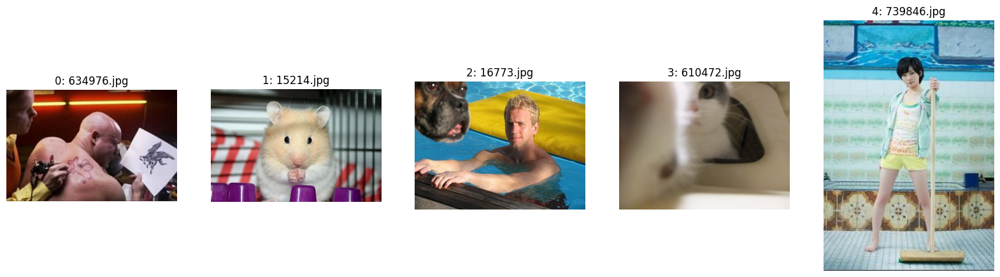

0: <BOS>俺のスタンド<EOS>ママの中<EOS>マ<EOS>マの味！！<EOS>マ！？<EOS>ーーー！！？？<EOS>？
1: <BOS>あ、ごめん・・<EOS>のフタに入ってた・・・<EOS>・<EOS>が・。<EOS>の・・・。<EOS>の。<EOS>
2: <BOS>犬にエサを与えていた<EOS>を、犬が、犬が、、犬を連れて来た。<EOS>犬が、犬に変
3: <BOS>お前の耳は俺に聞こえなかったのか。<EOS>は猫だ。<EOS>の中のネズミが居る？<EOS>ママに。
4: <BOS>この人は、私を倒せるとでも？<EOS>シ！！<EOS>ティング！<EOS>ン！<EOS>ティラミス！<EOS>テ
Epoch 2/25


100%|██████████| 442/442 [00:13<00:00, 32.53it/s, loss=3.91, accuracy=0.33, perplexity=51.1] 


Train Loss: 3.8455, Train Accuracy: 0.3302, Train Perplexity: 47.5325
Test Loss: 3.9145, Test Accuracy: 0.3302, Test Perplexity: 51.0737


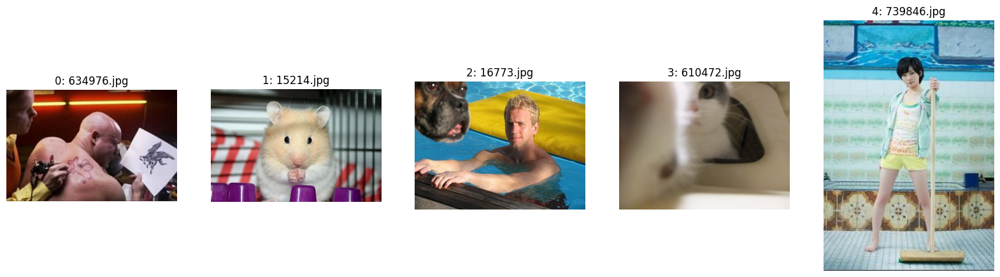

0: <BOS>お前、俺が見えるのか？<EOS>ママの顔見せろ。<EOS>。<EOS>。<EOS>ー！！<EOS>ル！！<EOS>
1: <BOS>俺の屁くっせ！！！<EOS>ー！<EOS>ル！！！！<EOS>ル！<EOS>ー！！！！！<EOS>ル！！
2: <BOS>このプール、目の周りが見える<EOS>ですか！？<EOS>です！<EOS>ルに見えてきます<EOS>ですか？<EOS>ですか！<EOS>ですか？
3: <BOS>ご主人が、さっきのカルカンを食べてると思った瞬間<EOS>だった<EOS>を忘れてしまった<EOS>を思い出した<EOS><EOS>
4: <BOS>あ、それ、、、、、、、、、、。。。。<EOS>。。。。<EOS>が。<EOS>ー。。。。
Epoch 3/25


100%|██████████| 442/442 [00:11<00:00, 36.87it/s, loss=3.87, accuracy=0.336, perplexity=49]  


Train Loss: 3.6272, Train Accuracy: 0.3493, Train Perplexity: 38.1813
Test Loss: 3.8718, Test Accuracy: 0.3359, Test Perplexity: 48.9680


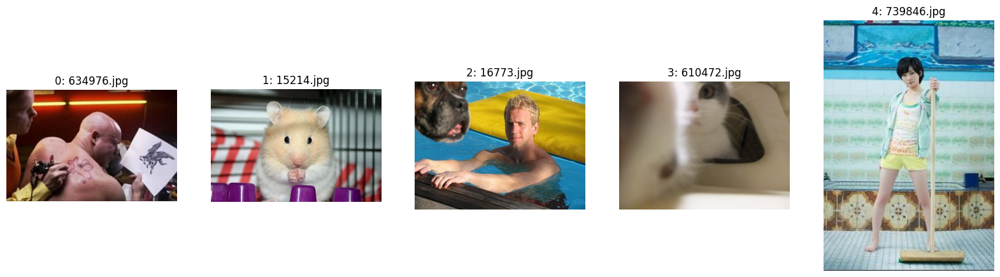

0: <BOS>この絵は、この子を描く時は、彼の頭を見て、、、、、、、、<EOS>、、、、
1: <BOS>あーあ！？今から言ってくれるの！<EOS>ーン！なんで<EOS>してー！？<EOS>ーー！<EOS>ー！！<EOS>
2: <BOS>あー！！今のボケ面白い！！！<EOS>ーーーーー！！！！！<EOS>ー！！！<EOS>ーー
3: <BOS>え？俺ってアライグマじゃないん？<EOS>？<EOS>くってたら。<EOS>くって。<EOS>ーーやー<EOS>ー。。<EOS>ーー
4: <BOS>あ、今日も疲れたわ。<EOS>ママも一緒に洗って出直してきな<EOS>で<EOS>して<EOS>。<EOS>で。<EOS>
Epoch 4/25


100%|██████████| 442/442 [00:13<00:00, 32.30it/s, loss=3.88, accuracy=0.339, perplexity=49.2]


Train Loss: 3.4622, Train Accuracy: 0.3645, Train Perplexity: 32.3671
Test Loss: 3.8763, Test Accuracy: 0.3387, Test Perplexity: 49.1679


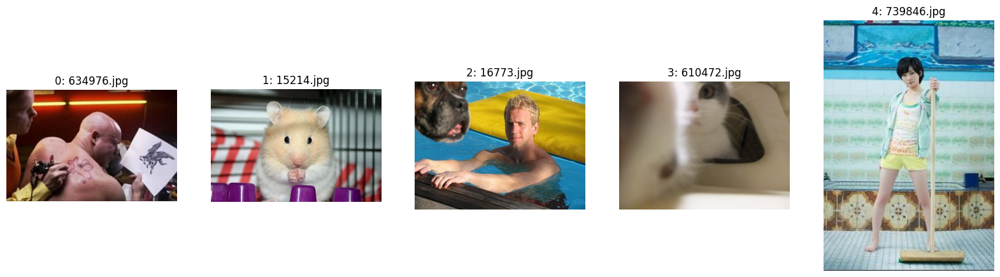

0: <BOS>俺、こんなにカラフルな彫りを見せてやる<EOS>ル！！<EOS>ーーー！<EOS>ーー！<EOS>ーン！<EOS>ー
1: <BOS>ハムスターの気持ちが悪い<EOS>ルに似てきた<EOS><EOS>マ<EOS>マ<EOS><EOS>ーーー！！！！<EOS>ル！<EOS>ル
2: <BOS>犬の糞が落ちてくるとは言うまでもない。<EOS>を考え直して<EOS>の悪ふざけをしている。<EOS>は。<EOS>を
3: <BOS>お前ら、俺より先にマタタビ浴びてこいよ。<EOS>ママ。<EOS>。<EOS>で。<EOS>、ミルク。<EOS>で。
4: <BOS>私を踏んだ<EOS>マ<EOS>、、、。<EOS>バーッ！<EOS>のクッパ。<EOS>、、、<EOS>！<EOS>、、<EOS>
Epoch 5/25


100%|██████████| 442/442 [00:12<00:00, 35.11it/s, loss=3.9, accuracy=0.339, perplexity=50.4] 


Train Loss: 3.3199, Train Accuracy: 0.3782, Train Perplexity: 28.0791
Test Loss: 3.8999, Test Accuracy: 0.3390, Test Perplexity: 50.3975


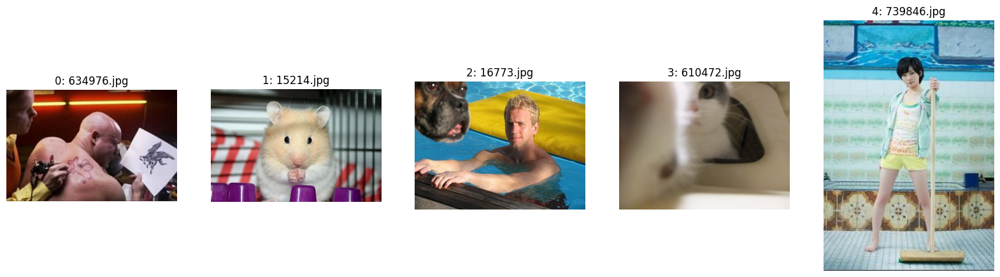

0: <BOS>彫師に憧れて<EOS>狂い<EOS>ルに撃ってしまった<EOS>カー<EOS><EOS>！<EOS>ーッ！！<EOS>ー！<EOS>ー
1: <BOS>ヒマワリの種をうまく撒いたようだね<EOS>ケ<EOS>！<EOS>メは！<EOS>メ！<EOS>！<EOS>！<EOS>！<EOS>ー！<EOS>
2: <BOS>お前は俺に任せろ！お前は先に行け！俺は先に行け！<EOS>けぇ！！<EOS>けぇだろ
3: <BOS>猫の手を借りた結果<EOS><EOS>！<EOS>！<EOS>ー！！<EOS>！！<EOS>！！！<EOS>ーー！<EOS>ー！<EOS>
4: <BOS>ちょっと待って。今足しびれてるから。<EOS>ン！<EOS>ン！<EOS>ー！！<EOS>ン！！<EOS>ー！！<EOS>
Epoch 6/25


100%|██████████| 442/442 [00:13<00:00, 32.28it/s, loss=3.95, accuracy=0.339, perplexity=53.3]


Train Loss: 3.1904, Train Accuracy: 0.3916, Train Perplexity: 24.6711
Test Loss: 3.9509, Test Accuracy: 0.3388, Test Perplexity: 53.2541


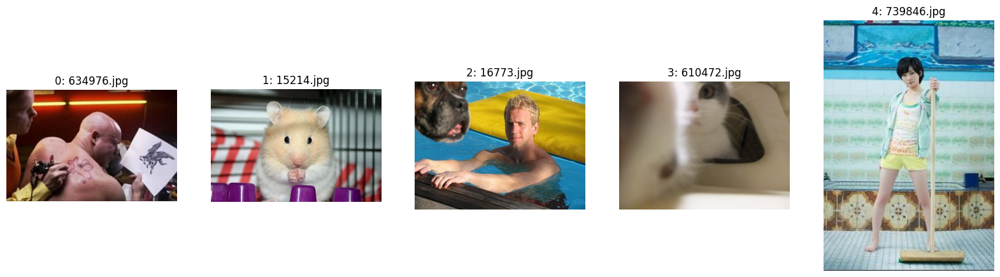

0: <BOS>ちょっと、ちょっとちょっと<EOS>イ<EOS>イって下さいね<EOS>ッス<EOS>イっと<EOS>ッッス<EOS>ーッス！
1: <BOS>ハムスターが脱走したハムスターが脱走した<EOS>ー！！！<EOS>ース！！<EOS>ー！！！！！！<EOS>ー！
2: <BOS>俺が弾ける前提で話してみると、この態度<EOS>ル上がってくれる<EOS>ー<EOS>ー<EOS>！<EOS>ー！<EOS>ー！！<EOS>
3: <BOS>猫鍋の中に猫が入ってきた<EOS>ーー！？<EOS>ーース！！<EOS>！！！？<EOS>ーー！？
4: <BOS>今日のコーディネートは何ですか？<EOS>ですか？はい。<EOS>ですか？<EOS>んですけど！<EOS>ですか！？<EOS>ですか？<EOS>ですか
Epoch 7/25


100%|██████████| 442/442 [00:12<00:00, 35.28it/s, loss=4.01, accuracy=0.338, perplexity=56.5]


Train Loss: 3.0704, Train Accuracy: 0.4046, Train Perplexity: 21.8874
Test Loss: 4.0086, Test Accuracy: 0.3383, Test Perplexity: 56.4562


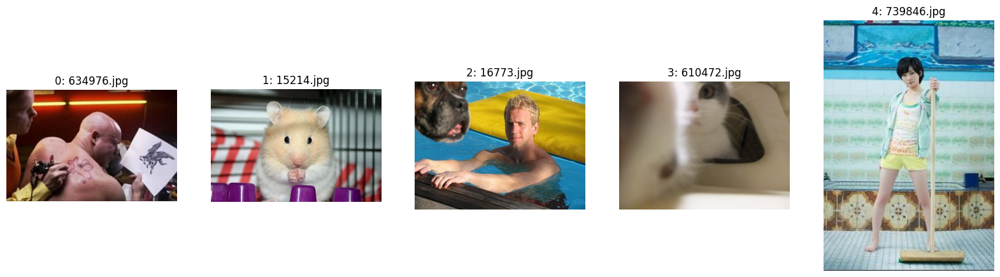

0: <BOS>お前が書いたんだ、この筆<EOS>！<EOS>！<EOS>ー！<EOS>ーーーー！！！！<EOS>ー！！！<EOS>
1: <BOS>飼い主が帰って来た<EOS>ーー！<EOS>ー！<EOS>ー！<EOS>ー！<EOS>ー！！<EOS>ー！<EOS>ー
2: <BOS>俺の手が、お前の手で押さえてる事は謝るから、早く渡れ<EOS>け<EOS>ー<EOS>べ<EOS>べ。
3: <BOS>お前、今俺の事を食った？<EOS>しろって？<EOS>しろ！<EOS>した？<EOS>しろっ！<EOS>から出て
4: <BOS>こんなに体重増えてる<EOS>、僕は屈強なんだよ。<EOS>は、<EOS>じゃねーか、、<EOS>よ！！<EOS><EOS>。<EOS>
Epoch 8/25


100%|██████████| 442/442 [00:13<00:00, 32.27it/s, loss=4.08, accuracy=0.334, perplexity=60.4]


Train Loss: 2.9592, Train Accuracy: 0.4175, Train Perplexity: 19.5875
Test Loss: 4.0763, Test Accuracy: 0.3336, Test Perplexity: 60.3830


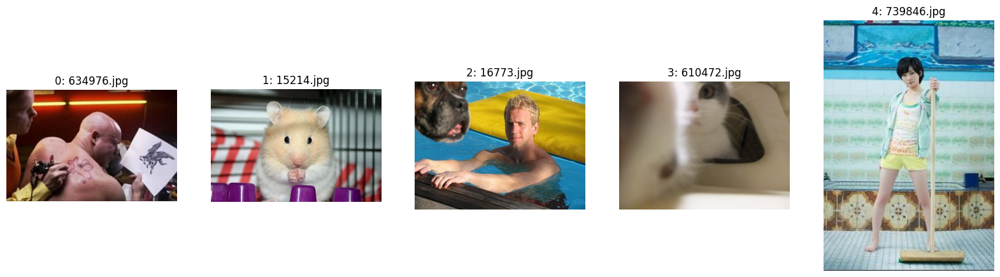

0: <BOS>この絵は誰？<EOS>？？<EOS>？<EOS>？<EOS>？俺、しりません。<EOS>？<EOS>ー？<EOS>ー？<EOS>ーー？
1: <BOS>ハムスターを見てニヤニヤしてたら、なんかすごいのになぁ<EOS>もない<EOS>もない。<EOS>かい？<EOS>かぁ<EOS>かぁ？<EOS>かぁ？<EOS>
2: <BOS>えー、俺が悪いんじゃねぇの？<EOS>ー？<EOS>ー？？<EOS>べーよ。<EOS>ー。<EOS>ー。<EOS>？
3: <BOS>猫が寝てる時にときどきしたい<EOS>ランプの精<EOS>かけなおすわり<EOS><EOS><EOS><EOS><EOS><EOS><EOS><EOS><EOS><EOS>ーーー！！
4: <BOS>私、脱ぐとスゴいんです。<EOS>手伝ってください。<EOS>ー。<EOS>、はい、次。<EOS>ー。<EOS>ー。<EOS>！
Epoch 9/25


100%|██████████| 442/442 [00:13<00:00, 33.30it/s, loss=4.15, accuracy=0.331, perplexity=65.1]


Train Loss: 2.8560, Train Accuracy: 0.4304, Train Perplexity: 17.6722
Test Loss: 4.1451, Test Accuracy: 0.3311, Test Perplexity: 65.0500


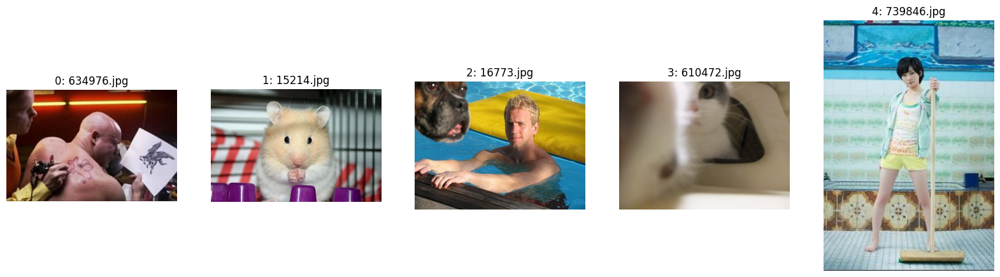

0: <BOS>あー、やっぱ俺の人生詰んだわ。<EOS>ー、やっぱりこんねー。<EOS>んなー<EOS>ーわー。<EOS>ー
1: <BOS>今日も指名入らないから！<EOS>ママに言うから<EOS>歌って<EOS>ーーーーーーーー！！<EOS>ー！
2: <BOS>この犬、どうにも弾ける<EOS>よ<EOS>。<EOS>？<EOS>？<EOS>？<EOS>ラス？？<EOS>？<EOS>？<EOS>？<EOS>なよ？<EOS>
3: <BOS>猫の手を借りた。<EOS>つがご主人なのか。<EOS>か？<EOS>か？<EOS>帽なのかしら・・？？<EOS>か？<EOS>
4: <BOS>この格好で学校行くだけで大便すると言う事聞いてください<EOS>します。<EOS>します<EOS>します。<EOS>します。<EOS>します。<EOS>
Epoch 10/25


100%|██████████| 442/442 [00:12<00:00, 36.46it/s, loss=4.24, accuracy=0.329, perplexity=71.3]


Train Loss: 2.7601, Train Accuracy: 0.4427, Train Perplexity: 16.0620
Test Loss: 4.2395, Test Accuracy: 0.3292, Test Perplexity: 71.3338


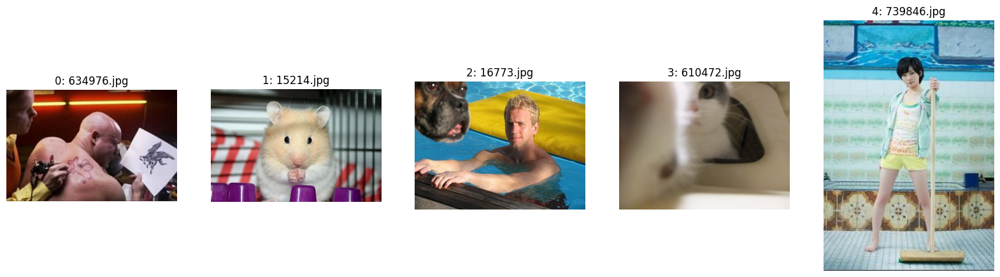

0: <BOS>この店で一番輝いていいか？<EOS>キ、後は頼んでこうなったか？<EOS>プ<EOS>キや！<EOS>キ！<EOS>！！
1: <BOS>お弁当のサンドイッチが入ってるハムスターが毎日が多い<EOS>ル。<EOS>ルが悪くなってきた。<EOS>は悪い<EOS>
2: <BOS>俺の中の何かがふっさふさの兄弟。<EOS>ンだと？<EOS>ンだぜ？<EOS>ンだぜ？<EOS>ラスー！<EOS>ラスヤロ
3: <BOS>猫の手を借りてきました<EOS>歓迎<EOS>ラス。<EOS>空気読んでください<EOS>いません？<EOS>ーです。<EOS>グロ注意。
4: <BOS>この後、スタッフでおいしく頂きました。<EOS>ギャッツビーしましょう。<EOS>はよ。<EOS>はよ。<EOS>。。<EOS><EOS>。
Epoch 11/25


100%|██████████| 442/442 [00:12<00:00, 35.59it/s, loss=4.3, accuracy=0.326, perplexity=76.2] 


Train Loss: 2.6717, Train Accuracy: 0.4546, Train Perplexity: 14.7022
Test Loss: 4.2980, Test Accuracy: 0.3262, Test Perplexity: 76.1695


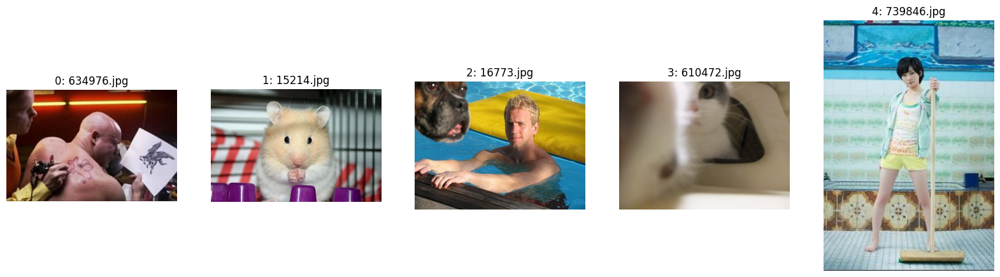

0: <BOS>この後彫師に惨敗した<EOS>し、絶望の水晶は無い<EOS>ブッス<EOS>ブッ<EOS>ブッ参上！<EOS>ブッ<EOS>！
1: <BOS>飼い主が、彼女とイチャつく手で別れを告げた後、別れを告げたが、後のことが頭から離せない<EOS>
2: <BOS>このボケは評価待ちです<EOS>ル<EOS>ルに評価を付けたりしたい<EOS>くさんやれよ、これからも頑張ってられます。<EOS>？<EOS>
3: <BOS>鏡を見て猫背が直った<EOS><EOS><EOS><EOS>い<EOS>ジャレ<EOS>い！<EOS>い！<EOS>い！<EOS>い！<EOS>い
4: <BOS>俺の方が先に見つけたよ！<EOS>浴びてくれ<EOS>い？<EOS>な？<EOS>ん？<EOS>ん？<EOS>ん？<EOS>な
Epoch 12/25


100%|██████████| 442/442 [00:12<00:00, 35.92it/s, loss=4.38, accuracy=0.323, perplexity=83]  


Train Loss: 2.5900, Train Accuracy: 0.4661, Train Perplexity: 13.5499
Test Loss: 4.3832, Test Accuracy: 0.3229, Test Perplexity: 83.0227


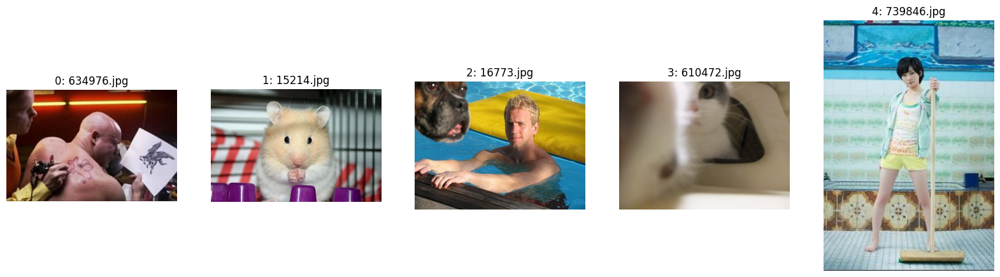

0: <BOS>後は若い男性と添い合い<EOS>です！<EOS>！<EOS>イんス！！<EOS>い！！！！！！<EOS>い
1: <BOS>ひまわりをよく見て下さい。これが我らの採取実験です。<EOS>度が高過ぎると爆発しますよね？<EOS>的でしょ？<EOS>？
2: <BOS>俺の中の悪魔と天使が、どっちかが悪魔しかでてこない<EOS>。<EOS>ピーマンと囁く。<EOS>売ってるし。<EOS>？
3: <BOS>猫背を直したい<EOS>ママに怒られてんのか、ご飯の時間<EOS>が怖い<EOS><EOS>を見ている<EOS>が怖くて
4: <BOS>最近、身の丈が変わった？<EOS>ママ？<EOS>？<EOS>ラスク？？<EOS>ナイ？どっちにする？<EOS>？？<EOS>？
Epoch 13/25


100%|██████████| 442/442 [00:12<00:00, 35.31it/s, loss=4.46, accuracy=0.32, perplexity=90.3] 


Train Loss: 2.5145, Train Accuracy: 0.4770, Train Perplexity: 12.5648
Test Loss: 4.4646, Test Accuracy: 0.3201, Test Perplexity: 90.2516


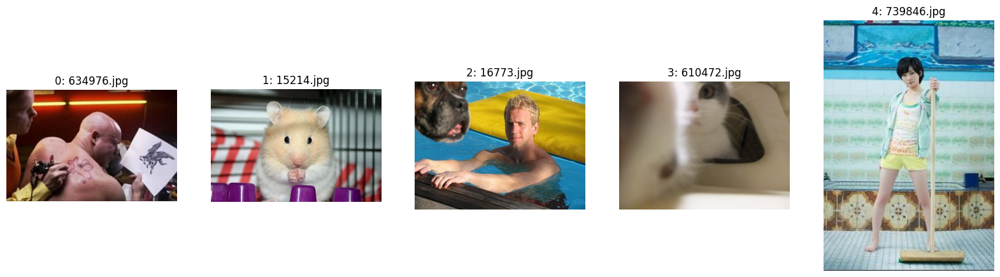

0: <BOS>彼の遺書が遺書だと書かれた移しさ。。。<EOS><EOS>。。<EOS>。<EOS>。<EOS><EOS><EOS>？<EOS>？<EOS>が
1: <BOS>ひまわりの種？いいえ、これは、私、、種です。<EOS>です！<EOS>けなんです！！<EOS>です！！<EOS>です！！<EOS>
2: <BOS>犬の首を取りに行ったはずのおじいちゃんが、またやり過ご主人の金に困ってる<EOS>。<EOS>号泣<EOS>で
3: <BOS>ネコみを襲われた<EOS>！って行ったらこうなった<EOS>。<EOS>はいいもんだったよー。<EOS>した？<EOS>？<EOS>？<EOS>じゃね
4: <BOS>お隣さんなら良い人そうだぜ<EOS>ママ。<EOS>しないなら引くわ<EOS>かせて<EOS>。<EOS>？<EOS>キ！<EOS>キ！<EOS>
Epoch 14/25


100%|██████████| 442/442 [00:14<00:00, 30.77it/s, loss=4.54, accuracy=0.319, perplexity=97.3]


Train Loss: 2.4439, Train Accuracy: 0.4875, Train Perplexity: 11.7099
Test Loss: 4.5382, Test Accuracy: 0.3192, Test Perplexity: 97.2914


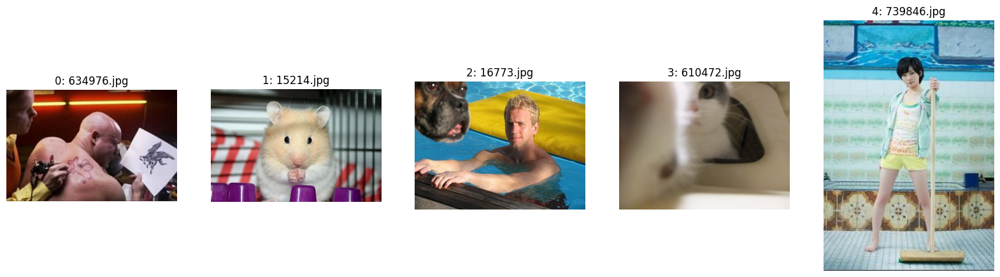

0: <BOS>あのーー、やっぱり忘れものー、、、、<EOS>変わってー！<EOS>、、、<EOS>！<EOS>！！<EOS>！！
1: <BOS>ひまわりの種なんて食うもんだから、そんなんじゃないんだよ。<EOS>かしっ屁なんだから<EOS>けだよ。<EOS>さんもう力が出
2: <BOS>今から、犬と少年とサルが人間のハーフだと思い込み、よく聞いてくる<EOS>生活を始めました。<EOS>がた
3: <BOS>猫をかぶってるやつを見た<EOS>の飼い方。<EOS>が早く気付いてくれ！<EOS>いにゃ<EOS>いにゃ<EOS>！<EOS>
4: <BOS>足臭っ！！<EOS>コントローラー臭っ！！<EOS>？もしかして臭っ！？<EOS>？もしかして違う？<EOS>の？
Epoch 15/25


100%|██████████| 442/442 [00:13<00:00, 33.40it/s, loss=4.63, accuracy=0.315, perplexity=107]


Train Loss: 2.3790, Train Accuracy: 0.4973, Train Perplexity: 10.9717
Test Loss: 4.6348, Test Accuracy: 0.3150, Test Perplexity: 107.1009


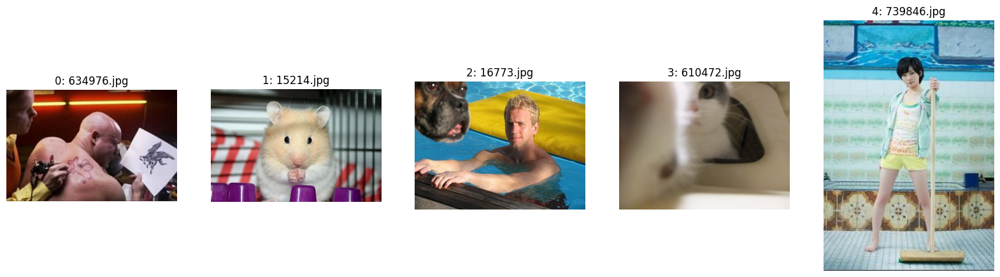

0: <BOS>これ以上は剃れません<EOS>ォオオ？<EOS>のとるで大変なんだぜ？<EOS>っ！<EOS>してっ！<EOS>いってんじゃねぇ
1: <BOS>ハムスターが無事保護された<EOS>に、ハムスターを手に入れて以来、やけになった<EOS>がツライ<EOS><EOS><EOS><EOS>が安
2: <BOS>犬も歩けば棒に当たったようだ<EOS>く<EOS>けぇ！<EOS>ママに言いつけるぞ！<EOS>べ！<EOS>べ！<EOS>べ
3: <BOS>猫鍋猫の怨霊<EOS>猫<EOS>揚がりました。ご許してください。<EOS>から上のご登場です。<EOS>から五体です、
4: <BOS>この格好をしたら、このくらいの子供を驚かせばいいんだろ！<EOS>でも、なんだけどな。<EOS>になってるのか。<EOS>のなんか？
Epoch 16/25


  1%|▏         | 611/42624 [00:38<41:07, 17.02it/s, loss=2.01, accuracy=0.561, perplexity=7.54]  

In [8]:
generator = SentenceGenerator(len(tokenizer.get_vocab()), MAX_SENTENCE_LENGTH + 1, HIDDEN_DIM, 768)

START_EPOCH = 0
train_loss_history = list()
test_loss_history = list()
train_acc_history = list()
test_acc_history = list()
train_perplexity_history = list()
test_perplexity_history = list()

# 学習履歴がある場合，途中から再開する
if os.path.exists(f"{result_dir}train_history.json"):
    with open(f"{result_dir}train_history.json", "r") as f:
        history = json.load(f)
        train_loss_history = history["train_loss_history"]
        test_loss_history = history["test_loss_history"]
        train_acc_history = history["train_acc_history"]
        test_acc_history = history["test_acc_history"]
    
    START_EPOCH = len(train_loss_history)
    generator.load_state_dict(torch.load(f"{result_dir}generator_{START_EPOCH}.pth"))

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
generator = generator.to(device)
optimizer = optim.Adam(generator.parameters(), lr = LERNING_RATE)

def calculate_accuracy(outputs, teacher_signals):
    _, predicted = torch.max(outputs, dim=-1)
    mask = teacher_signals != 0
    
    correct = (predicted == teacher_signals) & mask 
    correct = correct.sum().item()
    
    total = mask.sum().item()
    accuracy = correct / total if total > 0 else 0
    return accuracy

def calculate_perplexity(loss):
    return torch.exp(loss)

def train_step(generator, optimizer, inputs_1, inputs_2, teacher_signals):
    generator.train()
    optimizer.zero_grad()

    inputs_1 = inputs_1.to(device)
    inputs_2 = inputs_2.to(device)
    teacher_signals = teacher_signals.to(device)

    outputs = generator(inputs_2, inputs_1)
    
    outputs = outputs.view(-1, outputs.size(-1))  # [32*32, 8192]
    teacher_signals = teacher_signals.view(-1)    # [32*32]

    loss = F.cross_entropy(outputs, teacher_signals, 
                           ignore_index = 0)
    loss.backward()
    optimizer.step()

    accuracy = calculate_accuracy(outputs, teacher_signals)
    perplexity = calculate_perplexity(loss)

    return loss.item(), accuracy, perplexity.item()

def test_step(generator, inputs_1, inputs_2, teacher_signals):
    generator.eval()

    inputs_1 = inputs_1.to(device)
    inputs_2 = inputs_2.to(device)
    teacher_signals = teacher_signals.to(device)

    with torch.no_grad():
        outputs = generator(inputs_2, inputs_1)

        outputs = outputs.view(-1, outputs.size(-1))  # [32*32, 8192]
        teacher_signals = teacher_signals.view(-1)    # [32*32]

        loss = F.cross_entropy(outputs, teacher_signals, 
                               ignore_index = 0)
        accuracy = calculate_accuracy(outputs, teacher_signals)
        perplexity = calculate_perplexity(loss)

    return loss.item(), accuracy, perplexity.item()

for epoch in range(START_EPOCH, EPOCHS):
    print(f"Epoch {epoch + 1}/{EPOCHS}")

    # train
    train_loss = 0
    train_accuracy = 0
    train_perplexity = 0
    total_samples = 0
    pb = tqdm(train_dataloader)
    for inputs_1, inputs_2, teacher_signals in pb:
        batch_size = inputs_1.size(0)

        loss, accuracy, perplexity = train_step(generator, optimizer, inputs_1, inputs_2, teacher_signals)

        train_loss += loss * batch_size
        train_accuracy += accuracy * batch_size
        train_perplexity += perplexity * batch_size
        total_samples += batch_size

        pb.set_postfix({"loss": train_loss / total_samples, "accuracy": train_accuracy / total_samples, "perplexity": train_perplexity / total_samples})
    train_loss /= total_samples
    train_accuracy /= total_samples
    train_perplexity /= total_samples

    # test
    test_loss = 0
    test_accuracy = 0
    test_perplexity = 0
    total_samples = 0
    pb = tqdm(test_dataloader)
    for inputs_1, inputs_2, teacher_signals in pb:
        batch_size = inputs_1.size(0)

        loss, accuracy, perplexity = test_step(generator, inputs_1, inputs_2, teacher_signals)

        test_loss += loss * batch_size
        test_accuracy += accuracy * batch_size
        test_perplexity += perplexity * batch_size
        total_samples += batch_size

        pb.set_postfix({"loss": test_loss / total_samples, "accuracy": test_accuracy / total_samples, "perplexity": test_perplexity / total_samples})
    test_loss /= total_samples
    test_accuracy /= total_samples
    test_perplexity /= total_samples

    print(f"Train Loss: {train_loss:.4f}, Train Accuracy: {train_accuracy:.4f}, Train Perplexity: {train_perplexity:.4f}")
    print(f"Test Loss: {test_loss:.4f}, Test Accuracy: {test_accuracy:.4f}, Test Perplexity: {test_perplexity:.4f}")

    train_loss_history.append(train_loss)
    test_loss_history.append(test_loss)
    train_acc_history.append(train_accuracy)
    test_acc_history.append(test_accuracy)
    train_perplexity_history.append(train_perplexity)
    test_perplexity_history.append(test_perplexity)
    with open(f"{result_dir}train_history.json", "w") as f:
        json.dump({
            "train_loss_history": train_loss_history,
            "test_loss_history": test_loss_history,
            "train_acc_history": train_acc_history,
            "test_acc_history": test_acc_history,
            "train_perplexity_history": train_perplexity_history,
            "test_perplexity_history": test_perplexity_history
        }, f)
    
    torch.save(generator.state_dict(), f"{result_dir}generator_{epoch + 1}.pth")
    if os.path.exists(f"{result_dir}generator_{epoch}.pth"):
        os.remove(f"{result_dir}generator_{epoch}.pth")
    
    if min(train_loss_history) == train_loss:
        torch.save(generator.state_dict(), f"{result_dir}generator_best.pth")
        if os.path.exists(f"{result_dir}generator_best_{epoch}.pth"):
            os.remove(f"{result_dir}generator_best_{epoch}.pth")

    test_image_paths = list(set([f"{IMAGE_DIR}{IN}.jpg" for IN in test_inputs_1]))
    generate_ohgiri(vit, image_feature_extractor, generator, test_image_paths[:5], tokenizer)
    print("=" * 50)

# 学習結果を描画
fig = plt.figure(figsize = (5, 5))
ax = fig.add_subplot(1, 1, 1)
ax.plot(train_loss_history, label = "train")
ax.plot(test_loss_history, label = "test")
ax.set_xlabel("epoch")
ax.set_ylabel("loss")
ax.legend()
ax.grid()

fig.savefig(f"{result_dir}train_history.png")

In [ ]:
from transformers import PreTrainedModel, PretrainedConfig

class GUMI_T_Config(PretrainedConfig):
    def __init__(self, vocab_size, input_length, hidden_dim, patch_dim, **kwargs):
        super().__init__(**kwargs)
        self.vocab_size = vocab_size
        self.input_length = input_length
        self.hidden_dim = hidden_dim
        self.patch_dim = patch_dim

class GUMI_T(PreTrainedModel):
    def __init__(self, config):
        super(GUMI_T, self).__init__(config)

        self.input_length = config.input_length

        self.vit = ViTModel.from_pretrained("google/vit-base-patch16-224-in21k")
        self.image_feature_extractor = ViTFeatureExtractor.from_pretrained("google/vit-base-patch16-224-in21k")

        self.generator = SentenceGenerator(
            config.vocab_size, 
            config.input_length, 
            config.hidden_dim, 
            config.patch_dim
        )

    def forward(self, input_ids, image_features):
        """
            input_ids: 単語のIDのリスト(batch_size, input_length)
            image_features: 画像の特徴量のリスト(batch_size, 196, 768)
        """
        
        outputs = self.generator(input_ids, image_features, )
        
        return outputs # [batch_size, input_length, vocab_size]

    def generate(self, inputs):
        pil_images = inputs["pixel_values"]

        images = self.image_feature_extractor(pil_images, return_tensors = "pt")
        image_features = self.vit(**images).last_hidden_state[:, 1:, :]

        gen_texts = torch.ones(size = (len(pil_images), 1)).to(torch.int32)

        for i in range(1, self.input_length):
            tmp_texts = F.pad(gen_texts, (0, self.input_length - i), value = 0).to(torch.int32)
            outputs = self.forward(tmp_texts, image_features)

            logits = outputs[:, i, :]
            probs = F.softmax(logits, dim = -1)

            top_k_probs, top_k_indices = torch.topk(probs, k = 5, dim = -1)
            top_k_probs = top_k_probs / top_k_probs.sum(dim = -1, keepdim = True) 
            chosen_indices = torch.multinomial(top_k_probs, 1).squeeze(-1)
            gathered_indices = top_k_indices.gather(-1, chosen_indices.unsqueeze(-1))

            gen_texts = torch.cat([gen_texts, gathered_indices], dim = 1)